In [1]:
import numpy as np
import pandas
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
Iax_dir = "/Users/tktakaro/Documents/Type-Iax-HST" #"D:/Research/Type-Iax-HST"
catalog = np.loadtxt(Iax_dir + "/images/sn2012z/acs_all.dolphot.dat")

In [3]:
pos_predict = np.zeros((catalog.shape[0],2))
info_predict = np.zeros(np.shape(catalog))

j = 0 # Iteration variable for positions array
for i in range(catalog.shape[0]): # Cycles through each object in catalog
    # Checks to make sure point is "good"
    # Good defined by: 1. S/N > 3     2. Sharpness < .25     3. Roundness < 1     4. Crowding < .5 
    #                  5. Object type = "Bright Star"     6. ML algorithm picks as good
    if ((catalog[i][5] >= 3)&(abs(catalog[i][6]) < .3)&(abs(catalog[i][7]) < 1)
        &(catalog[i][9] < .5)):
        pos_predict[j][0] = catalog[i][2] # Assigns X position
        pos_predict[j][1] = catalog[i][3] # Assigns Y position
        info_predict[j] = catalog[i]
        j = j + 1
                
# Trims all zeros from end of positions array, left from "bad" objects
pos_predict = pos_predict[~np.all(pos_predict == 0, axis=1)]
info_predict = info_predict[~np.all(info_predict == 0, axis=1)]

# Saves high S/N object X,Y positions
np.savetxt("Region_files/sn2012z_Prediction.reg", pos_predict, '%5.2f')

# Load in stars in ROI and produce isochrone CMDs

In [4]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2012z_200pc.reg", "r+")

def mysplit(s, delim=None):
    return [x for x in s.split(delim) if x]

text = asci.readlines()
region = np.zeros([45,2])
for i in range(45):
    A = mysplit(text[i+3], ' # ')
    if A[1][-2] == 'w':
        region[i][0] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
        region[i][1] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]
region = region[~np.all(region == 0, axis=1)]

# Info for each star chosen as real 
infoF3 = np.zeros([region.shape[0],info_predict.shape[1]])

j = 0 # Iteration variable for region array
for i in range(info_predict.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == pos_predict[i][0])&(region[j][1] == pos_predict[i][1]):
        infoF3[j] = info_predict[i]
        j = j + 1
        if j == region.shape[0]: break

In [5]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2012z_133pc.reg", "r+")

text = asci.readlines()
region = np.zeros([19,2])
for i in range(19):
    A = mysplit(text[i+3], ' # ')
    if A[1][-2] == 'w':
        region[i][0] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
        region[i][1] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]
region = region[~np.all(region == 0, axis=1)]

infoF2 = np.zeros([region.shape[0], info_predict.shape[1]])

j = 0 # Iteration variable for region array
for i in range(infoF3.shape[0]): # Cycles through each star predicted above
    if np.array_equal(region[j],infoF3[i][2:4]):
        infoF2[j] = infoF3[i]
        j = j + 1
        if j == region.shape[0]: break

In [6]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2012z_67pc.reg", "r+")

text = asci.readlines()
region = np.zeros([4,2])
for i in range(4):
    A = mysplit(text[i+3], ' # ')
    if A[1][-2] == 'w':
        region[i][0] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
        region[i][1] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]
region = region[~np.all(region == 0, axis=1)]

infoF1 = np.zeros([region.shape[0], info_predict.shape[1]])

j = 0 # Iteration variable for region array
for i in range(infoF2.shape[0]): # Cycles through each star predicted above
    if np.array_equal(region[j],infoF2[i][2:4]):
        infoF1[j] = infoF2[i]
        j = j + 1
        if j == region.shape[0]: break

[-1, 4, 30, 25]

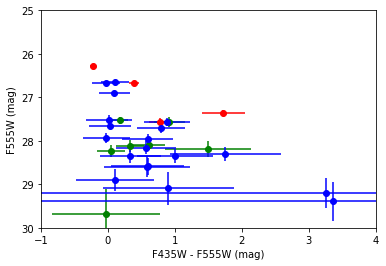

In [7]:
for i in range(infoF3.shape[0]):
    for j in range(infoF2.shape[0]):
        if np.array_equal(infoF3[i],infoF2[j]):
            infoF3[i] = np.zeros(infoF3[i].size)
for i in range(infoF2.shape[0]):
    for j in range(infoF1.shape[0]):
        if np.array_equal(infoF2[i],infoF1[j]):
            infoF2[i] = np.zeros(infoF2[i].size)

infoF2 = infoF2[~np.all(infoF2 == 0, axis=1)]
infoF3 = infoF3[~np.all(infoF3 == 0, axis=1)]
# F555W vs F435W - F555W
F435W_F1 = infoF1[:,15]
xerr_F1 = np.sqrt(infoF1[:,17]**2 + infoF1[:,30]**2)
F555W_F1 = infoF1[:,28]
yerr_F1 = infoF1[:,30]

F435W_F2 = infoF2[:,15]
xerr_F2 = np.sqrt(infoF2[:,17]**2 + infoF2[:,30]**2)
F555W_F2 = infoF2[:,28]
yerr_F2 = infoF2[:,30]

F435W_F3 = infoF3[:,15]
xerr_F3 = np.sqrt(infoF3[:,17]**2 + infoF3[:,30])
F555W_F3 = infoF3[:,28]
yerr_F3 = infoF3[:,30]

line1 = plt.errorbar(F435W_F1 - F555W_F1, F555W_F1, fmt='ro', xerr=xerr_F1, yerr=yerr_F1)
line2 = plt.errorbar(F435W_F2 - F555W_F2, F555W_F2, fmt='go', xerr=xerr_F2, yerr=yerr_F2)
line3 = plt.errorbar(F435W_F3 - F555W_F3, F555W_F3, fmt='bo', xerr=xerr_F3, yerr=yerr_F3)

#plt.plot(F435W_F1 - F555W_F1, F555W_F1, 'ro', F435W_F2 - F555W_F2, F555W_F2, 'go', F435W_F3 - F555W_F3, F555W_F3, 'bo')
plt.gca().invert_yaxis()
plt.xlabel('F435W - F555W (mag)')
plt.ylabel('F555W (mag)')
plt.axis([-1,4,30,25])

[-1, 3, 30, 25]

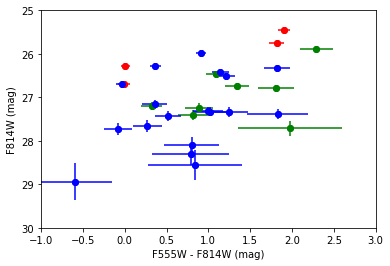

In [8]:
xerr2_F1 = np.sqrt(infoF1[:,43]**2 + infoF1[:,30]**2)
F814W_F1 = infoF1[:,41]
yerr2_F1 = infoF1[:,43]

xerr2_F2 = np.sqrt(infoF2[:,43]**2 + infoF2[:,30]**2)
F814W_F2 = infoF2[:,41]
yerr2_F2 = infoF2[:,43]

xerr2_F3 = np.sqrt(infoF3[:,43]**2 + infoF3[:,30]**2)
F814W_F3 = infoF3[:,41]
yerr2_F3 = infoF3[:,43]

line1 = plt.errorbar(F555W_F1 - F814W_F1, F814W_F1, fmt='ro', xerr=xerr2_F1, yerr=yerr2_F1)
line2 = plt.errorbar(F555W_F2 - F814W_F2, F814W_F2, fmt='go', xerr=xerr2_F2, yerr=yerr2_F2)
line3 = plt.errorbar(F555W_F3 - F814W_F3, F814W_F3, fmt='bo', xerr=xerr2_F3, yerr=yerr2_F3)


plt.plot(F555W_F1 - F814W_F1, F814W_F1, 'ro', F555W_F2 - F814W_F2, F814W_F2, 'go', F555W_F3 - F814W_F3, F814W_F3, 'bo')
plt.gca().invert_yaxis()
plt.xlabel('F555W - F814W (mag)')
plt.ylabel('F814W (mag)')
plt.axis([-1,3,30,25])

In [9]:
import os
import glob
import matplotlib as mpl

mist_dir = Iax_dir + "/MIST_v1.0_HST_ACSWF"
# All of this MIST isochrone code comes from Asher

In [10]:
kwargs = {"names": ["EEP", "log10_isochrone_age_yr", "initial_mass", "log_Teff", "log_g",
                    "log_L", "z_surf", "ACS_WFC_F435W", "ACS_WFC_F475W", "ACS_WFC_F502N",
                    "ACS_WFC_F550M", "ACS_WFC_F555W", "ACS_WFC_F606W", "ACS_WFC_F625W", 
                    "ACS_WFC_F658N", "ACS_WFC_F660N", "ACS_WFC_F775W", "ACS_WFC_F814W",
                    "ACS_WFC_F850LP", "ACS_WFC_F892N", "phase"],
         "delim_whitespace": True, "comment": "#"}
isochrones = {}
for filename in glob.glob(mist_dir + "/*.iso.cmd"):
    feh_string = filename.split("/")[-1].split("_")[3] # Pulls metalicity information
    if feh_string[0] == "p":
        feh = float(feh_string[1:]) # feh is [Fe/H]
    elif feh_string[0] == "m":
        feh = -float(feh_string[1:])
    else:
        raise ValueError
    df = pandas.read_csv(filename, **kwargs)
    df['ages'] = 10 ** df.log10_isochrone_age_yr / 1e9
    isochrones[feh] = df # Creates dictionary accessible by entering a particular metalicity

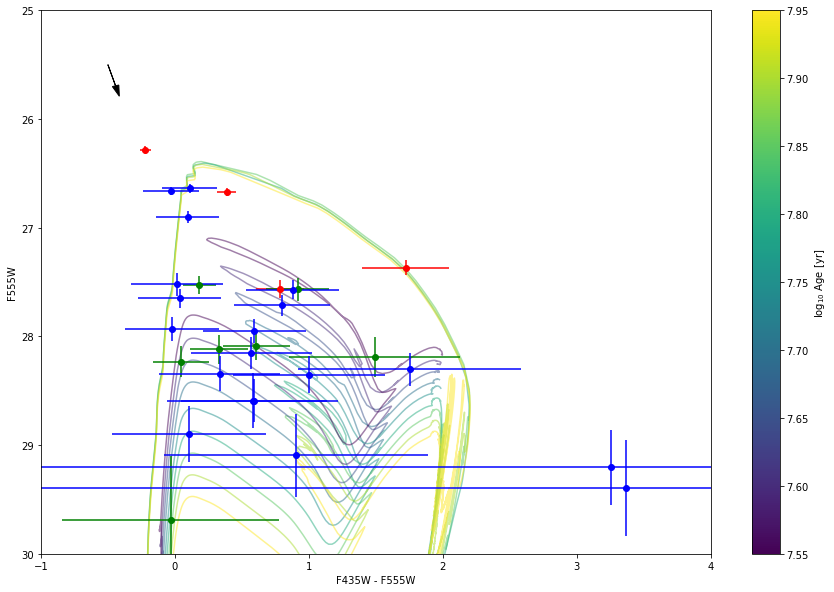

In [11]:
# fix metallicity, vary age
df = isochrones[-.25]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

ages = ages[(ages > 7.5) & (ages < 8)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Three adjustments: 1. Distance: added to mag 2. MW Extinction: added to both. 3. Galactic extinction
    dist_adjust = 5 * (np.log10(31.96e6) - 1)
    F435W_ext = 0.144 # extinction in F435W in NGC 1309 from NED
    F555W_ext = 0.112 # extinction in F555W in NGC 1309 from NED
    Gal_ext = 0.07
    # Multiply Gal_ext by A_lambda/E(B-V) values from Schlafly, Finkbeiner 2011
    mag = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*Gal_ext
    color = df[idx].ACS_WFC_F435W - df[idx].ACS_WFC_F555W  + F435W_ext - F555W_ext + (3.610 - 2.792) * Gal_ext
    age_cmd[age] = (color, mag)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
# Plots stars
line1 = plt.errorbar(F435W_F1 - F555W_F1, F555W_F1, fmt='ro', xerr=xerr_F1, yerr=yerr_F1)
line2 = plt.errorbar(F435W_F2 - F555W_F2, F555W_F2, fmt='go', xerr=xerr_F2, yerr=yerr_F2)
line3 = plt.errorbar(F435W_F3 - F555W_F3, F555W_F3, fmt='bo', xerr=xerr_F3, yerr=yerr_F3)
#plt.plot(F435W_F1 - F555W_F1, F555W_F1, 'ro', F435W_F2 - F555W_F2, F555W_F2, 'go', F435W_F3 - F555W_F3, F555W_F3, 'bo')
# Plots reddening vector
plt.arrow(-0.5, 25.5, (3.610 - 2.792)*Gal_ext, 2.792*Gal_ext, head_width=0.05, head_length=0.1, fc='k', ec='k')

plt.xlabel("F435W - F555W")
plt.ylabel("F555W")
plt.ylim(30,25)
plt.xlim(-1, 4)
cb = plt.colorbar(sm)
cb.set_label('$\log_{10}$ Age [yr]')
plt.draw()
plt.show()

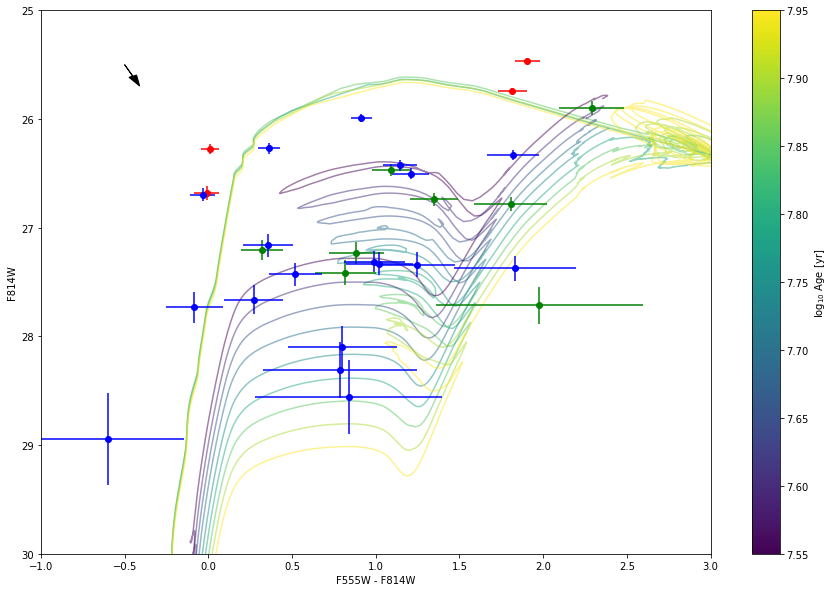

In [12]:
# fix metallicity, vary age
df = isochrones[-.25]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}


ages = ages[(ages > 7.5) & (ages < 8)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Two adjustments: 1. Distance: added to mag 2. Extinction: added to both.
    F814W_ext = 0.061 # extinction in F814W in NGC 1309 from NED
    mag = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    color = df[idx].ACS_WFC_F555W - df[idx].ACS_WFC_F814W + F555W_ext - F814W_ext + (2.792 - 1.526)*Gal_ext
    age_cmd[age] = (color, mag)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
# Plots stars
line1 = plt.errorbar(F555W_F1 - F814W_F1, F814W_F1, fmt='ro', xerr=xerr2_F1, yerr=yerr2_F1)
line2 = plt.errorbar(F555W_F2 - F814W_F2, F814W_F2, fmt='go', xerr=xerr2_F2, yerr=yerr2_F2)
line3 = plt.errorbar(F555W_F3 - F814W_F3, F814W_F3, fmt='bo', xerr=xerr2_F3, yerr=yerr2_F3)
#plt.plot(F555W_F1 - F814W_F1, F814W_F1, 'ro', F555W_F2 - F814W_F2, F814W_F2, 'go', F555W_F3 - F814W_F3, F814W_F3, 'bo')
# Plots reddening vector
plt.arrow(-0.5, 25.5, (2.219 - 1.526)*Gal_ext, 1.526*Gal_ext, head_width=0.05, head_length=0.1, fc='k', ec='k')

plt.xlabel("F555W - F814W")
plt.ylabel("F814W")
plt.ylim(30,25)
plt.xlim(-1, 3)
cb = plt.colorbar(sm)
cb.set_label('$\log_{10}$ Age [yr]')

# Removing clusters

In [13]:
# Using IRAF to compute actual concentration index, i.e. photometry at .5 pixels to photometry at 3 pixels
ascii_1 = open(Iax_dir + "/images/sn2012z/acs_f555w_all_drc.fits1.mag.1")
ascii_2 = open(Iax_dir + "/images/sn2012z/acs_f555w_all_drc.fits1.mag.2")
text_1 = ascii_1.readlines()
text_2 = ascii_2.readlines()

concentration = np.zeros(45)
for i in range(45):
    if mysplit(text_1[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at .5 pixels
        concentration[i] = 99
    elif mysplit(text_2[5*i + 79])[4] == 'INDEF': # Removes objects with no defined magnitude at 3 pixels
        concentration[i] = -99
    else: concentration[i] = float(mysplit(text_1[5*i + 79])[4]) - float(mysplit(text_2[5*i + 79])[4])
ascii_1.close()
ascii_2.close()

In [14]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2012z_200pc.reg", "r+")
text = asci.readlines()

region = np.zeros([45,2])
for i in range(45):
    A = mysplit(text[i+3], ' # ')
    region[i][0] = mysplit(mysplit(A[0], 'point')[0],',')[0][1:]
    region[i][1] = mysplit(mysplit(A[0], 'point')[0],',')[1][:-1]

# Info for each star chosen as real 
info = np.zeros([region.shape[0],info_predict.shape[1]])

j = 0 # Iteration variable for region array
for i in range(info_predict.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == pos_predict[i][0])&(region[j][1] == pos_predict[i][1]):
        info[j] = info_predict[i]
        j = j + 1
        if j == region.shape[0]: break

(-2, -7)

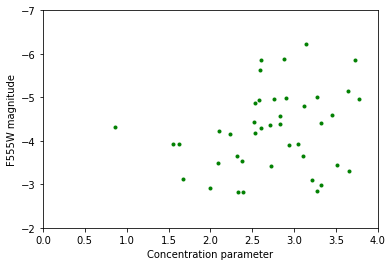

In [116]:
# Plots the concentration parameter vs magnitude
plt.plot(concentration, info[:,28] - 5*(np.log10(31.92e6) - 1), 'g.')
plt.xlabel('Concentration parameter')
plt.ylabel('F555W magnitude')
plt.xlim(0,4)
plt.ylim(-2,-7)
#plt.ylim(30,26)

In [124]:
# Cut out clusters (identified as objects with concentration parameter < 2.3, from Chandar et. al. 2010)
new_info = np.zeros(info.shape)
for i in range(45):
    if not((concentration[i] < 2.5) and (info[i,28] - 5*(np.log10(31.92e6) - 1) < -5)): #(concentration[i] < 2.3):
        new_info[i] = info[i]
new_info = new_info[~np.all(new_info == 0, axis=1)]

In [125]:
print(new_info.shape)

(45, 414)


In [72]:
np.savetxt("Region_files/sn2012z_NoClustersROI.reg", new_info[:,2:4], '%5.2f')

In [18]:
asci = open(Iax_dir + "/jupyter_notebooks/Region_files/sn2012z_NoClustersROI_133pc.reg", "r+")
text = asci.readlines()
region = np.zeros([45,2])

for i in range(2):
    region[i][0] = mysplit(text[i])[0]
    region[i][1] = mysplit(text[i])[1]
region = region[~np.all(region == 0, axis=1)]

new_info1 = np.copy(new_info) # Will hold stars within 200 parsecs
new_info2 = np.zeros([region.shape[0], new_info.shape[1]]) # Will hold stars within 133 parsecs

j = 0 # Iteration variable for region array
for i in range(new_info.shape[0]): # Cycles through each star predicted above
    if (region[j][0] == new_info[i][2])&(region[j][1] == new_info[i][3]):
        new_info2[j] = new_info[i]
        j = j + 1
        if j == region.shape[0]: break
              
                
for i in range(new_info1.shape[0]):
    for j in range(new_info2.shape[0]):
        if np.array_equal(new_info1[i],new_info2[j]):
            new_info1[i] = np.zeros(new_info1[i].size)
            
new_info1 = new_info1[~np.all(new_info1 == 0, axis=1)]
new_info2 = new_info2[~np.all(new_info2 == 0, axis=1)]

In [19]:
# Reddening, metallicity, and distance errors
dist_lower = 5 * (np.log10(31.96e6 - .81e6) - 1)
dist_upper = 5 * (np.log10(31.96e6 + .81e6) - 1)
red_lower = 0.07
red_upper = 0.07
metal_lower = 0
metal_upper = 0

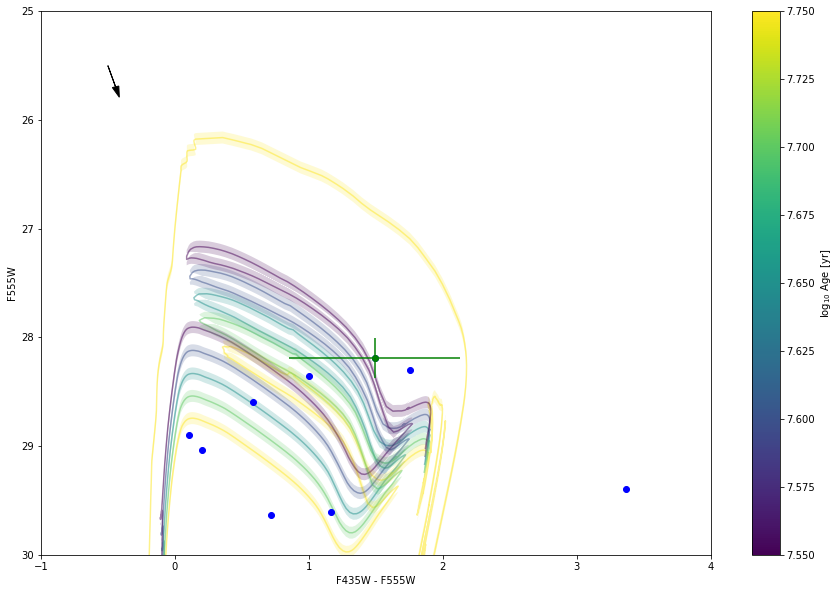

In [20]:
# fix metallicity, vary age
df = isochrones[0]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

ages = ages[(ages > 7.5) & (ages < 7.8)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Three adjustments: 1. Distance: added to mag 2. MW Extinction: added to both. 3. Galactic extinction
    dist_adjust = 5 * (np.log10(31.96e6) - 1)
    F435W_ext = 0.144 # extinction in F435W in NGC 1309 from NED
    F555W_ext = 0.112 # extinction in F555W in NGC 1309 from NED
    Gal_ext = 0.07
    # Multiply Gal_ext by A_lambda/E(B-V) values from Schlafly, Finkbeiner 2011
    mag = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*Gal_ext
    mag_lower = df[idx].ACS_WFC_F555W + dist_lower + F555W_ext + 2.792*red_lower
    mag_upper = df[idx].ACS_WFC_F555W + dist_upper + F555W_ext + 2.792*red_upper
    color = df[idx].ACS_WFC_F435W - df[idx].ACS_WFC_F555W  + F435W_ext - F555W_ext + (3.610 - 2.792) * Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
# Plots stars
#line1 = plt.errorbar(new_info3[:,15] - new_info3[:,28], new_info3[:,28], fmt='ro', 
#                     xerr=np.sqrt(new_info3[:,17]**2 + new_info3[:,30]**2), yerr=new_info3[:,30])
line2 = plt.errorbar(new_info2[:,15] - new_info2[:,28], new_info2[:,28], fmt='go', 
                     xerr=np.sqrt(new_info2[:,17]**2 + new_info2[:,30]**2), yerr=new_info2[:,30])
line3 = plt.plot(new_info[:,15] - new_info[:,28], new_info[:,28], 'bo')

# Plots reddening vector
plt.arrow(-0.5, 25.5, (3.610 - 2.792)*Gal_ext, 2.792*Gal_ext, head_width=0.05, head_length=0.1, fc='k', ec='k')

plt.xlabel("F435W - F555W")
plt.ylabel("F555W")
plt.ylim(30,25)
plt.xlim(-1, 4)
cb = plt.colorbar(sm)
cb.set_label('$\log_{10}$ Age [yr]')
plt.draw()
plt.show()

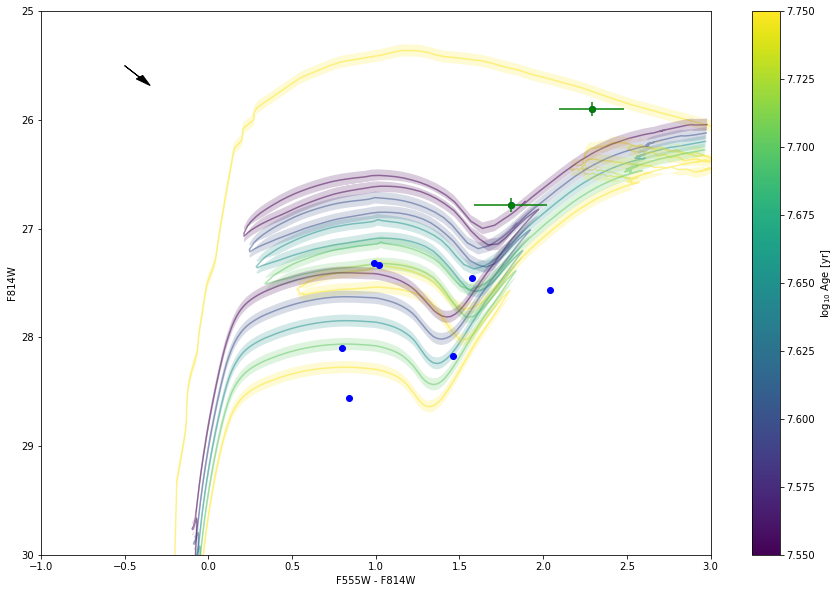

In [21]:
# fix metallicity, vary age
df = isochrones[0]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}


ages = ages[(ages > 7.5) & (ages < 7.8)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    # Two adjustments: 1. Distance: added to mag 2. Extinction: added to both.
    F814W_ext = 0.061 # extinction in F814W in NGC 1309 from NED
    mag = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    mag_lower = df[idx].ACS_WFC_F814W + dist_lower + F814W_ext + 1.526*red_lower
    mag_upper = df[idx].ACS_WFC_F814W + dist_upper + F814W_ext + 1.526*red_upper    
    color = df[idx].ACS_WFC_F555W - df[idx].ACS_WFC_F814W + F555W_ext - F814W_ext + (2.792 - 1.526)*Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')
sm.set_array(ages)
plt.subplots(figsize=(15, 10))
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    plt.plot(color, mag, alpha=0.5, color=sm.to_rgba(age), zorder=0)
    plt.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
    
# Plots stars
#line1 = plt.errorbar(new_info3[:,28] - new_info3[:,41], new_info3[:,41], fmt='ro', 
#                     xerr=np.sqrt(new_info3[:,30]**2 + new_info3[:,43]**2), yerr=new_info3[:,43])
line2 = plt.errorbar(new_info2[:,28] - new_info2[:,41], new_info2[:,41], fmt='go', 
                     xerr=np.sqrt(new_info2[:,30]**2 + new_info2[:,43]**2), yerr=new_info2[:,43])
line3 = plt.plot(new_info[:,28] - new_info[:,41], new_info[:,41], 'bo')

# Plots reddening vector
plt.arrow(-0.5, 25.5, (2.792 - 1.526)*Gal_ext, 1.526*Gal_ext, head_width=0.05, head_length=0.1, fc='k', ec='k')

plt.xlabel("F555W - F814W")
plt.ylabel("F814W")
plt.ylim(30,25)
plt.xlim(-1, 3)
cb = plt.colorbar(sm)
cb.set_label('$\log_{10}$ Age [yr]')

## Crappy Chi-Squared Test

In [22]:
import matplotlib as mpl
mist_dir = "/Users/tktakaro/Documents/Type-Iax-HST/MIST/ACS-WFC"


kwargs = {"names": ["EEP", "log10_isochrone_age_yr", "initial_mass", "star_mass", "log_Teff", "log_g",
                    "log_L", "[Fe/H]_init", "[Fe/H]", "ACS_WFC_F435W", "ACS_WFC_F475W", "ACS_WFC_F502N",
                    "ACS_WFC_F550M", "ACS_WFC_F555W", "ACS_WFC_F606W", "ACS_WFC_F625W", "ACS_WFC_F658N",
                    "ACS_WFC_F660N", "ACS_WFC_F775W", "ACS_WFC_F814W", "ACS_WFC_F850LP", "ACS_WFC_F892N", "phase"],
         "delim_whitespace": True, "comment": "#"}
isochrones = {}
for filename in glob.glob(mist_dir + "/*.iso.cmd"):
    filename = filename.replace("\\", "/")
    feh_string = filename.split("/")[-1].split("=")[1].split(".iso")[0] # Pulls metalicity information
    feh = float(feh_string) # feh is [Fe/H]
    df = pandas.read_csv(filename, **kwargs)
    df['ages'] = 10 ** df.log10_isochrone_age_yr / 1e9

    isochrones[feh] = df # Creates dictionary accessible by entering a particular metalicity

In [128]:
metallicity = np.array([-.59, -.51, -.43, -.35, -.27])
reddening = np.array([.01, .04, .07, .11, .14])
SN_pos = np.array([1968.937, 2258.970])
CChi = np.zeros([metallicity.size, reddening.size, 41, 4, 1]) #41 = n_ages
CChi_temp = np.zeros([2,1])

for k, met in enumerate(metallicity):
    df = isochrones[met] # Sets metallicity
    ages = np.array(list(set(df.log10_isochrone_age_yr)))
    ages.sort()
    ages = ages[(ages >= 6.5) & (ages <= 8.5)]
    for j, red in enumerate(reddening):
        for i, age in enumerate(ages):
            CChi[k, j, i, 1, :] = met
            CChi[k, j, i, 2, :] = red
            CChi[k, j, i, 3, :] = age
            
            idx = df.log10_isochrone_age_yr == age
            mag_435 = df[idx].ACS_WFC_F435W + dist_adjust + F435W_ext + 3.610*Gal_ext
            mag_555 = df[idx].ACS_WFC_F555W + dist_adjust + F555W_ext + 2.792*Gal_ext
            mag_814 = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
            
            
            phys_dist_temp = 0 # This will hold the total physical distance weights to be averaged and divided out to normalize
            temp = 0 # This will hold the distance for each data point to the line
    
            # Sets the radial dispersion for the region
            sigma = 5 * (.92 * 10**age * 3.15e7 * 206265)/(31.96e6 * 3.086e13 * .05) # Replace 10**age w/ 10000000
            flat = (100 * 206265)/(31.96e6 * .05) # 100 parsecs in pixels
            flat_int = int(np.round(flat*5))
            for l in range(new_info.shape[0]):
                # Removes "stars" with mag > 90 in any band
                if (new_info[l,15] > 90) or (new_info[l,28] > 90) or (new_info[l,41] > 90):
                    continue
        
                # Uses physical distance between star and SN position to weight each star
                phys_dist = np.sqrt((SN_pos[0] - new_info[l,2])**2 + (SN_pos[1] - new_info[l,3])**2)
                weight_func = np.convolve(1/(np.sqrt(2 * np.pi) * sigma) * np.exp(- np.linspace(-200,200,2000)**2/(2 * sigma**2)),
                   np.append(np.zeros(int(np.ceil((2000-flat_int)/2))),np.append(np.ones(flat_int),np.zeros(int(np.floor((2000-flat_int)/2))))))
                phys_dist_weight = weight_func[1999 + int(phys_dist*5)]
                phys_dist_temp += phys_dist_weight # Will be used to compute average of the weights
        
                # Adds the difference in mags for each data point in quadrature.
                temp += (phys_dist_weight * np.amin(np.sqrt((new_info[l,15] - mag_435)**2
                  + (new_info[l,28] - mag_555)**2 + (new_info[l,41] - mag_814)**2)))**2
    
            phys_dist_temp /= (new_info.shape[0] - 4) #1)
            CChi[k,j,i,0,:] = np.sqrt(temp)/phys_dist_temp

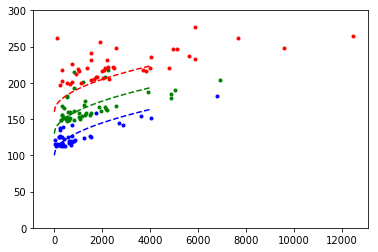

In [129]:
# Testing to find relationship between flux and flux error
x_array=np.linspace(0, 4000, num=100)

plt.plot(new_info[:,11], new_info[:,17]/1.0857 * new_info[:,11], 'b.')
plt.plot(x_array, 100 + np.sqrt(x_array), 'b--')
plt.plot(new_info[:,24], new_info[:,30]/1.0857 * new_info[:,24], 'g.')
plt.plot(x_array, 130 + np.sqrt(x_array), 'g--')
plt.plot(new_info[:,37], new_info[:,43]/1.0857 * new_info[:,37], 'r.')
plt.plot(x_array, 160 + np.sqrt(x_array), 'r--')
plt.ylim(0,300)
plt.show()

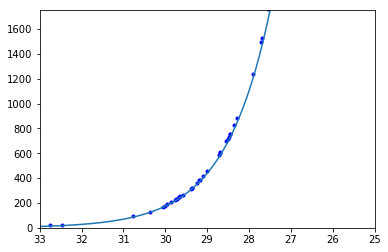

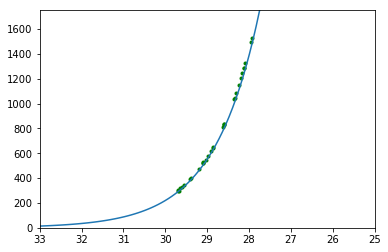

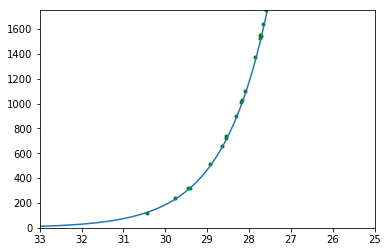

In [130]:
x_array = np.linspace(25,33,100)
plt.ylim(0,1750)
plt.xlim(33,25)
plt.plot(new_info[:,15], new_info[:,11], 'b.')
plt.plot(x_array, .9*9624 * 10**((25.760 - x_array)/2.5)) # or 1203
plt.show()

plt.ylim(0,1750)
plt.xlim(33,25)
plt.plot(new_info[:,28], new_info[:,24], 'g.')
plt.plot(x_array, .9*12642 * 10**((25.713 - x_array)/2.5))
plt.show()

plt.ylim(0,1750)
plt.xlim(33,25)
plt.plot(new_info[:,41], new_info[:,37], 'g.')
plt.plot(x_array, .9*12868 * 10**((25.511 - x_array)/2.5)) # or 1289
plt.show()

In [65]:
frac_array = np.ones([3,120])
np.save('12Z_frac.npy', frac_array)

In [66]:
# Now, replace the fitting functions (previously polynomials) with skew normal distributions
from scipy.optimize import curve_fit
from scipy.stats import skewnorm
import scipy.integrate as integrate

# This is the function which will be fed to the fitting algorithm.
def skew(x, norm, a, loc, scale):
    return norm * skewnorm.pdf(x, a, loc=loc, scale=scale)

In [133]:
print(new_info.shape[0] - 4)

41


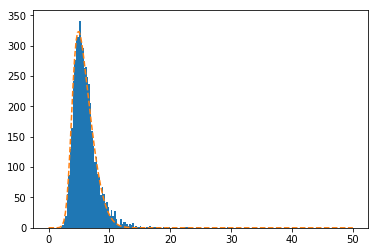

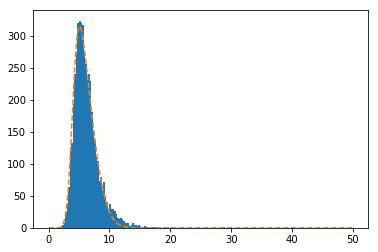

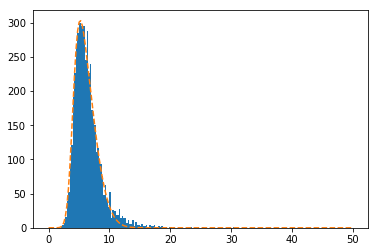

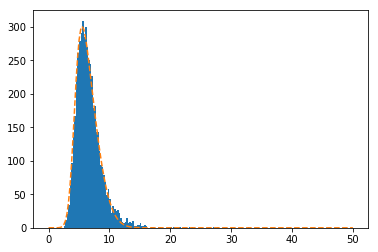

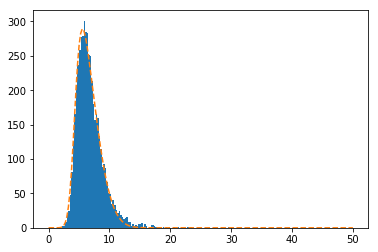

...

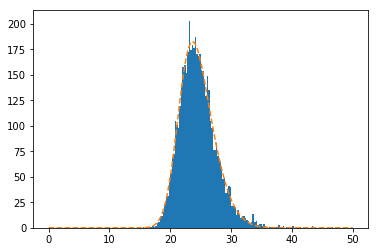

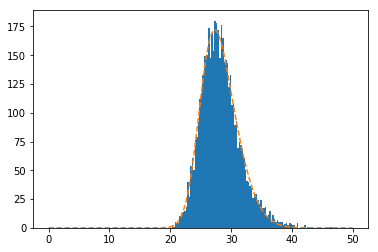

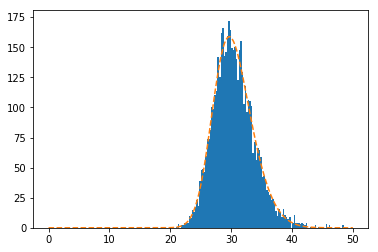

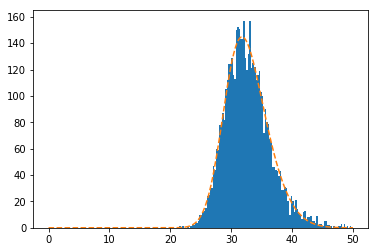

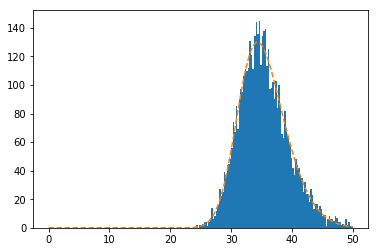

In [138]:
x = np.linspace(0,50,200)
probs = np.zeros([metallicity.size, reddening.size, 41]) #[]

CChi_false = np.load("MC_12Z_MagFit_1535057129.0/CChi_false_ages.npy")
for k, met in enumerate(metallicity):
    df = isochrones[met]
    ages = np.array(list(set(df.log10_isochrone_age_yr)))
    ages.sort()
    for j, red in enumerate(reddening):
        popt = (2000,3,10,2)
        for i, age in enumerate(ages):
            halt = False
            for l in range(5000):
                if np.isinf(CChi_false[k,j,i,0,l]) or np.isnan(CChi_false[k,j,i,0,l]):
                    CChi_false[k,j,i,0,l] = 999999999999
                    halt = True
                    probs[k,j,i] = 0
                    break
            if halt == True:
                probs[k,j,i] = 0
                continue
            y = plt.hist(41./9. * CChi_false[k,j,i,0,:], bins=np.linspace(0,50,201))[0]
            try:
                popt, pcov = curve_fit(skew, x, y, p0=popt)
            except RuntimeError:
                print(met, red, age)
                popt = [.1 * p for p in popt]
                popt, pcov = curve_fit(skew, x, y, p0=popt)
            plt.plot(x, skew(x, *popt), '--')
            plt.show()
            norm = integrate.quad(skew, 0, 50, args=(popt[0], popt[1], popt[2], popt[3]))[0]
            probs[k,j,i] = skew(CChi[k,j,i,0,0], *popt)/norm

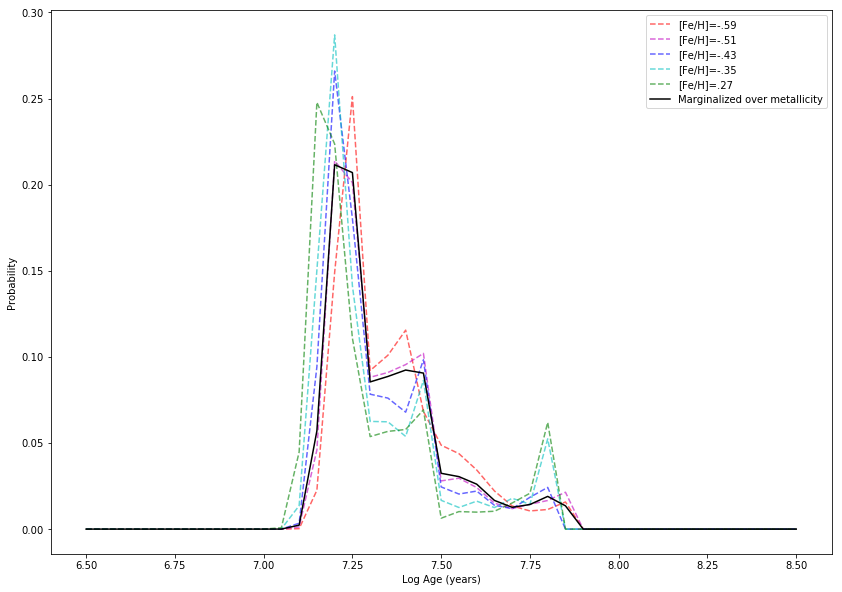

7.2


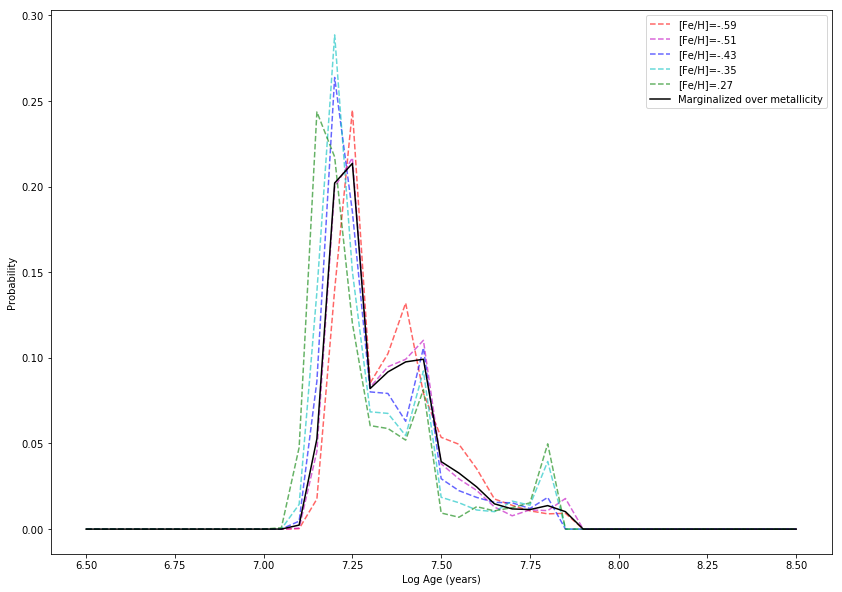

7.25


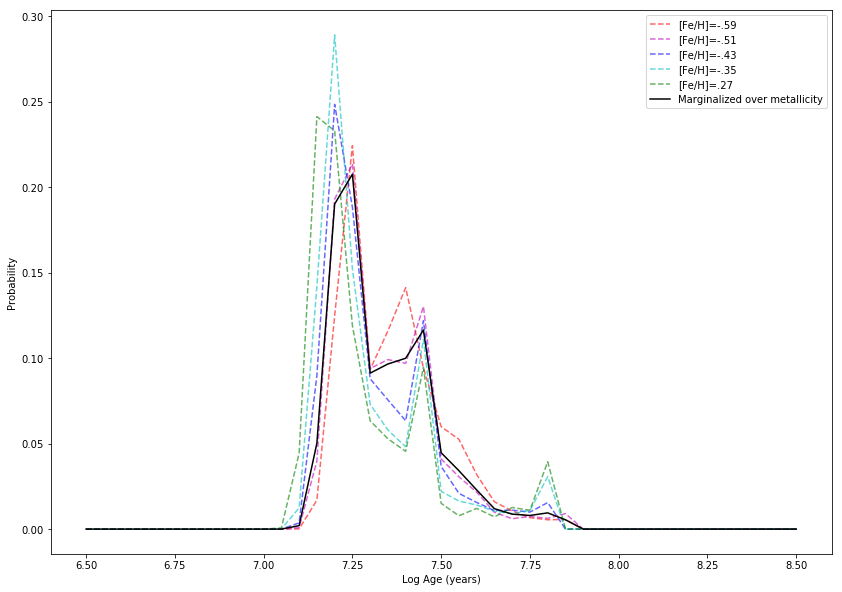

7.25


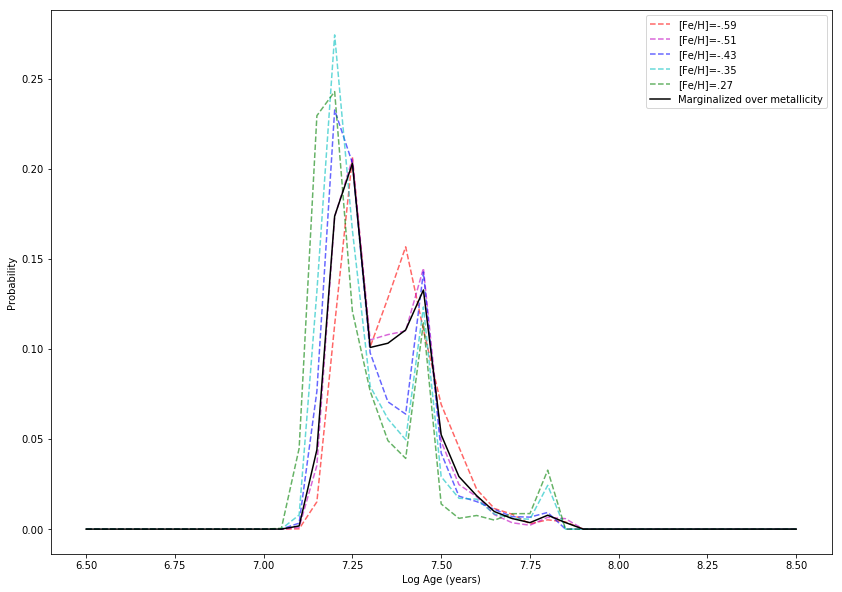

7.25


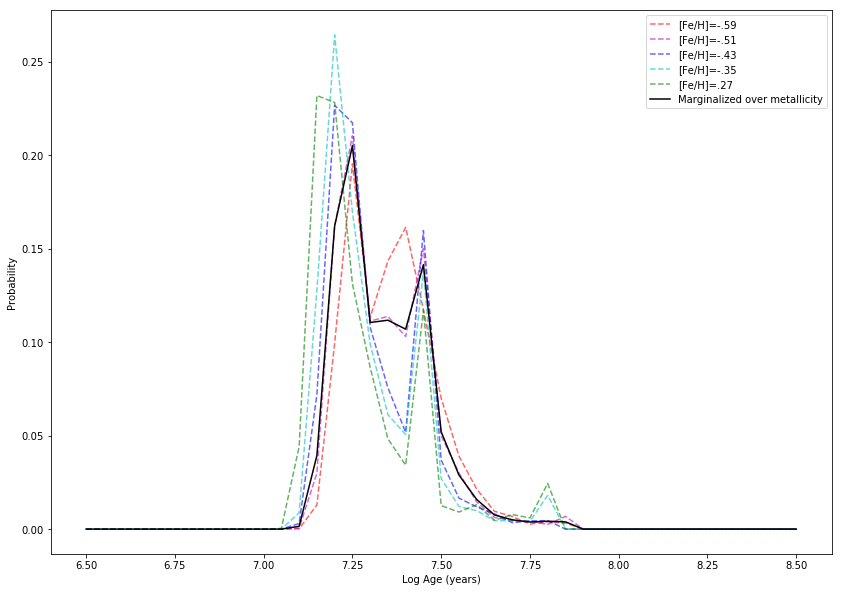

7.25


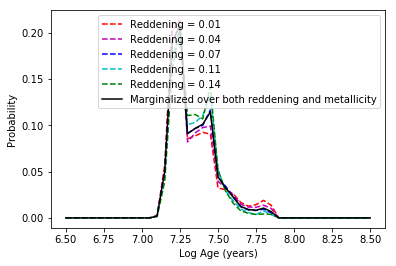

7.25


In [139]:
# Plotting all metallicities, assuming no reddening
plt.figure(figsize=(14,10));
plt.plot(CChi[0, 0, :, 3, 0], probs[0,0,:]/np.sum(probs[0,0,:]), 'r--', alpha=.6, label='[Fe/H]=-.59')
plt.plot(CChi[1, 0, :, 3, 0], probs[1,0,:]/np.sum(probs[1,0,:]), 'm--', alpha=.6, label='[Fe/H]=-.51')
plt.plot(CChi[2, 0, :, 3, 0], probs[2,0,:]/np.sum(probs[2,0,:]), 'b--', alpha=.6, label='[Fe/H]=-.43')
plt.plot(CChi[3, 0, :, 3, 0], probs[3,0,:]/np.sum(probs[3,0,:]), 'c--', alpha=.6, label='[Fe/H]=-.35')
plt.plot(CChi[4, 0, :, 3, 0], probs[4,0,:]/np.sum(probs[4,0,:]), 'g--', alpha=.6, label='[Fe/H]=.27')

# Applying a gaussian prior
mu = -0.51
sigma = .08
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

probs_0 = (probs[0,0,:] * norm(-.59) + probs[1,0,:] * norm(-.51) + probs[2,0,:] * norm(-.43) + 
            probs[3,0,:] * norm(-.35) + probs[4,0,:] * norm(-.27))/(
            norm(-.59) + norm(-.51) + norm(-.43) + norm(-.35) + norm(-.27))
plt.plot(CChi[0,0,:,3,0], probs_0/np.sum(probs_0), 'k', label='Marginalized over metallicity')

plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.legend()
plt.show()
print(CChi[0,0,:,3,0][np.argmax(probs_0)])

# Plotting all metallicities, assuming minimal reddening
plt.figure(figsize=(14,10));
plt.plot(CChi[0, 1, :, 3, 0], probs[0,1,:]/np.sum(probs[0,1,:]), 'r--', alpha=.6, label='[Fe/H]=-.59')
plt.plot(CChi[1, 1, :, 3, 0], probs[1,1,:]/np.sum(probs[1,1,:]), 'm--', alpha=.6, label='[Fe/H]=-.51')
plt.plot(CChi[2, 1, :, 3, 0], probs[2,1,:]/np.sum(probs[2,1,:]), 'b--', alpha=.6, label='[Fe/H]=-.43')
plt.plot(CChi[3, 1, :, 3, 0], probs[3,1,:]/np.sum(probs[3,1,:]), 'c--', alpha=.6, label='[Fe/H]=-.35')
plt.plot(CChi[4, 1, :, 3, 0], probs[4,1,:]/np.sum(probs[4,1,:]), 'g--', alpha=.6, label='[Fe/H]=.27')

probs_1 = (probs[0,1,:] * norm(-.59) + probs[1,1,:] * norm(-.51) + probs[2,1,:] * norm(-.43) + 
            probs[3,1,:] * norm(-.35) + probs[4,1,:] * norm(-.27))/(
            norm(-.59) + norm(-.51) + norm(-.43) + norm(-.35) + norm(-.27))
plt.plot(CChi[0,1,:,3,0], probs_1/np.sum(probs_1), 'k', label='Marginalized over metallicity')

plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.legend()
plt.show()
print(CChi[0,1,:,3,0][np.argmax(probs_1)])

# Plotting all metallicities, assuming median reddening
plt.figure(figsize=(14,10));
plt.plot(CChi[0, 2, :, 3, 0], probs[0,2,:]/np.sum(probs[0,2,:]), 'r--', alpha=.6, label='[Fe/H]=-.59')
plt.plot(CChi[1, 2, :, 3, 0], probs[1,2,:]/np.sum(probs[1,2,:]), 'm--', alpha=.6, label='[Fe/H]=-.51')
plt.plot(CChi[2, 2, :, 3, 0], probs[2,2,:]/np.sum(probs[2,2,:]), 'b--', alpha=.6, label='[Fe/H]=-.43')
plt.plot(CChi[3, 2, :, 3, 0], probs[3,2,:]/np.sum(probs[3,2,:]), 'c--', alpha=.6, label='[Fe/H]=-.35')
plt.plot(CChi[4, 2, :, 3, 0], probs[4,2,:]/np.sum(probs[4,2,:]), 'g--', alpha=.6, label='[Fe/H]=.27')

probs_2 = (probs[0,2,:] * norm(-.59) + probs[1,2,:] * norm(-.51) + probs[2,2,:] * norm(-.43) + 
            probs[3,2,:] * norm(-.35) + probs[4,2,:] * norm(-.27))/(
            norm(-.59) + norm(-.51) + norm(-.43) + norm(-.35) + norm(-.27))
plt.plot(CChi[0,2,:,3,0], probs_2/np.sum(probs_2), 'k', label='Marginalized over metallicity')

plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.legend()
plt.show()
print(CChi[0,2,:,3,0][np.argmax(probs_2)])

# Plotting all metallicities, assuming high reddening
plt.figure(figsize=(14,10));
plt.plot(CChi[0, 3, :, 3, 0], probs[0,3,:]/np.sum(probs[0,3,:]), 'r--', alpha=.6, label='[Fe/H]=-.59')
plt.plot(CChi[1, 3, :, 3, 0], probs[1,3,:]/np.sum(probs[1,3,:]), 'm--', alpha=.6, label='[Fe/H]=-.51')
plt.plot(CChi[2, 3, :, 3, 0], probs[2,3,:]/np.sum(probs[2,3,:]), 'b--', alpha=.6, label='[Fe/H]=-.43')
plt.plot(CChi[3, 3, :, 3, 0], probs[3,3,:]/np.sum(probs[3,3,:]), 'c--', alpha=.6, label='[Fe/H]=-.35')
plt.plot(CChi[4, 3, :, 3, 0], probs[4,3,:]/np.sum(probs[4,3,:]), 'g--', alpha=.6, label='[Fe/H]=.27')

probs_3 = (probs[0,3,:] * norm(-.59) + probs[1,3,:] * norm(-.51) + probs[2,3,:] * norm(-.43) + 
            probs[3,3,:] * norm(-.35) + probs[4,3,:] * norm(-.27))/(
            norm(-.59) + norm(-.51) + norm(-.43) + norm(-.35) + norm(-.27))
plt.plot(CChi[0,3,:,3,0], probs_3/np.sum(probs_3), 'k', label='Marginalized over metallicity')

plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.legend()
plt.show()
print(CChi[0,3,:,3,0][np.argmax(probs_3)])

# Plotting all metallicities, assuming maximum reddening
plt.figure(figsize=(14,10));
plt.plot(CChi[0, 4, :, 3, 0], probs[0,4,:]/np.sum(probs[0,4,:]), 'r--', alpha=.6, label='[Fe/H]=-.59')
plt.plot(CChi[1, 4, :, 3, 0], probs[1,4,:]/np.sum(probs[1,4,:]), 'm--', alpha=.6, label='[Fe/H]=-.51')
plt.plot(CChi[2, 4, :, 3, 0], probs[2,4,:]/np.sum(probs[2,4,:]), 'b--', alpha=.6, label='[Fe/H]=-.43')
plt.plot(CChi[3, 4, :, 3, 0], probs[3,4,:]/np.sum(probs[3,4,:]), 'c--', alpha=.6, label='[Fe/H]=-.35')
plt.plot(CChi[4, 4, :, 3, 0], probs[4,4,:]/np.sum(probs[4,4,:]), 'g--', alpha=.6, label='[Fe/H]=.27')

probs_4 = (probs[0,4,:] * norm(-.59) + probs[1,4,:] * norm(-.51) + probs[2,4,:] * norm(-.43) + 
            probs[3,4,:] * norm(-.35) + probs[4,4,:] * norm(-.27))/(
            norm(-.59) + norm(-.51) + norm(-.43) + norm(-.35) + norm(-.27))
plt.plot(CChi[0,4,:,3,0], probs_4/np.sum(probs_4), 'k', label='Marginalized over metallicity')

plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.legend()
plt.show()
print(CChi[0,4,:,3,0][np.argmax(probs_4)])


mu = .07
sigma = .03
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))
probs_tot = (probs_0 * norm(.01) + probs_1 * norm(.04) + probs_2 * norm(.07) + probs_3 * norm(.11)
             + probs_4 * norm(.14))/(norm(.01) + norm(.04) + norm(.07) + norm(.11) + norm(.14))
plt.plot(CChi[0,0,:,3,0], probs_0/np.sum(probs_0), 'r--', label='Reddening = 0.01')
plt.plot(CChi[0,1,:,3,0], probs_1/np.sum(probs_1), 'm--', label='Reddening = 0.04')
plt.plot(CChi[0,2,:,3,0], probs_2/np.sum(probs_2), 'b--', label='Reddening = 0.07')
plt.plot(CChi[0,3,:,3,0], probs_3/np.sum(probs_3), 'c--', label='Reddening = 0.11')
plt.plot(CChi[0,4,:,3,0], probs_4/np.sum(probs_4), 'g--', label='Reddening = 0.14')
plt.plot(CChi[0,2,:,3,0], probs_tot/np.sum(probs_tot), 'k', label='Marginalized over both reddening and metallicity')
plt.ylabel("Probability")
plt.xlabel("Log Age (years)")
plt.legend(loc=1)
plt.show()
np.save("Region_files/12Z_Mag_probs_clusters", probs_tot)
print(CChi[0,4,:,3,0][np.argmax(probs_tot)])

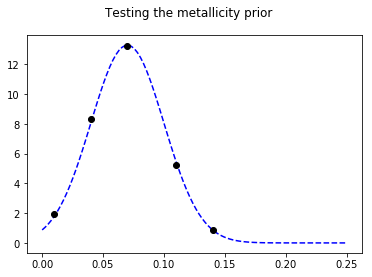

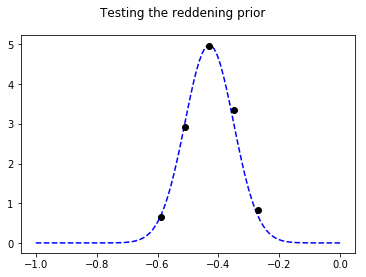

In [97]:
# Applying a gaussian prior
mu = .07
sigma = .03
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

x_array = np.linspace(0, .25, 100)
plt.plot(x_array, norm(x_array), 'b--', label='Prior')
plt.plot([.01, .04, .07, .11, .14], .38*np.array([np.sum(probs_0)*norm(.01), np.sum(probs_1)*norm(.04),
                                          np.sum(probs_2)*norm(.07), np.sum(probs_3)*norm(.11),
                                          np.sum(probs_4)*norm(.14)]), 'ko')
plt.suptitle('Testing the metallicity prior')
plt.show()


probs_r0 = (probs[0,0,:] * norm(.01) + probs[0,1,:] * norm(.04) + probs[0,2,:] * norm(.07) + 
            probs[0,3,:] * norm(.11) + probs[0,4,:] * norm(.14))/(
            norm(.01) + norm(.04) + norm(.07) + norm(.11) + norm(.14))
probs_r1 = (probs[1,0,:] * norm(.01) + probs[1,1,:] * norm(.04) + probs[1,2,:] * norm(.07) + 
            probs[1,3,:] * norm(.11) + probs[1,4,:] * norm(.14))/(
            norm(.01) + norm(.04) + norm(.07) + norm(.11) + norm(.14))
probs_r2 = (probs[2,0,:] * norm(.01) + probs[2,1,:] * norm(.04) + probs[2,2,:] * norm(.07) + 
            probs[2,3,:] * norm(.11) + probs[2,4,:] * norm(.14))/(
            norm(.01) + norm(.04) + norm(.07) + norm(.11) + norm(.14))
probs_r3 = (probs[3,0,:] * norm(.01) + probs[3,1,:] * norm(.04) + probs[3,2,:] * norm(.07) + 
            probs[3,3,:] * norm(.11) + probs[3,4,:] * norm(.14))/(
            norm(.01) + norm(.04) + norm(.07) + norm(.11) + norm(.14))
probs_r4 = (probs[4,0,:] * norm(.01) + probs[4,1,:] * norm(.04) + probs[4,2,:] * norm(.07) + 
            probs[4,3,:] * norm(.11) + probs[4,4,:] * norm(.14))/(
            norm(.01) + norm(.04) + norm(.07) + norm(.11) + norm(.14))

mu = -0.43
sigma = .08
def norm(x):
    return 1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))

x_array = np.linspace(-1, 0, 100)
plt.plot(x_array, norm(x_array), 'b--', label='Prior')
plt.plot([-.59, -.51, -.43, -.35, -.27], .37*np.array([np.sum(probs_r0)*norm(-.59), np.sum(probs_r1)*norm(-.51),
                                          np.sum(probs_r2)*norm(-.43), np.sum(probs_r3)*norm(-.35),
                                          np.sum(probs_r4)*norm(-.27)]), 'ko')
plt.suptitle('Testing the reddening prior')
plt.show()

## Making Subplots

In [25]:
# Reddening, metallicity, and distance errors
dist_lower = 5 * (np.log10(31.96e6 - .81e6) - 1)
dist_upper = 5 * (np.log10(31.96e6 + .81e6) - 1)

49.972972973
60.972972973
73.4594594595


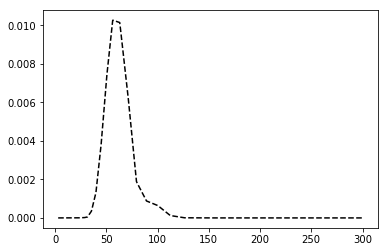

In [98]:
# Interpolate to get most accurate 68% confidence interval
x_interp = np.linspace(3, 300, 1000)
pdf_interp = np.interp(x_interp, (10**CChi[0,0,:,3,0])/1e6, probs_tot[:])

plt.plot(x_interp, pdf_interp/np.sum(pdf_interp), 'k--')

cdf_array = np.zeros([pdf_interp.shape[0], 2])
for i in range(pdf_interp.shape[0]):
    cdf_array[i,0] = x_interp[i]
    cdf_array[i,1] = np.sum(pdf_interp[:i+1])/np.sum(pdf_interp[:])
    
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - (1 - .6827)/2.))])
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - .5))])
print(cdf_array[:,0][np.argmin(np.abs(cdf_array[:,1] - (1 + .6827)/2.))])

In [111]:
print(10**7.8/1e6)

63.09573444801929


In [112]:
df = isochrones[-.43]
ages = np.array(list(set(df.log10_isochrone_age_yr)))
ages.sort()

age_cmd = {}

ages = ages[(ages > 7.79) & (ages < 7.81)]
for i, age in enumerate(ages):
    idx = df.log10_isochrone_age_yr == age
    mag = df[idx].ACS_WFC_F814W + dist_adjust + F814W_ext + 1.526*Gal_ext
    mag_lower = df[idx].ACS_WFC_F814W + dist_lower + F814W_ext + 1.526*red_lower
    mag_upper = df[idx].ACS_WFC_F814W + dist_upper + F814W_ext + 1.526*red_upper
    color = df[idx].ACS_WFC_F555W - df[idx].ACS_WFC_F814W + F555W_ext - F814W_ext + (2.792 - 1.526)*Gal_ext
    age_cmd[age] = (color, mag, mag_lower, mag_upper)

norm = mpl.colors.Normalize(vmin=ages.min(), vmax=ages.max())
sm = mpl.cm.ScalarMappable(norm=norm, cmap='viridis')

NameError: name 'probs_tot_all' is not defined

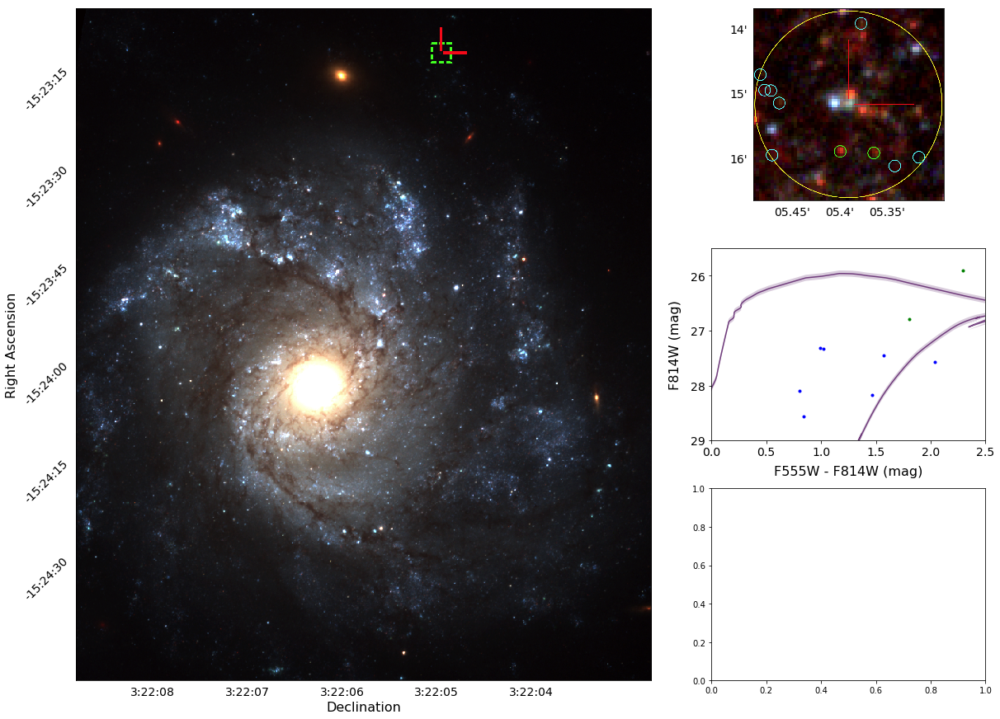

In [69]:
from matplotlib import gridspec
import matplotlib.image as im

# Setup figure and grid
fig = plt.figure(figsize=(20,15))
gs = gridspec.GridSpec(3, 3)
gs.update(wspace=0.18, hspace=0.25)

axis_font = {'size':'16'} # Sets font size
tick_font = {'size':'14'}

ax0 = plt.subplot(gs[:, :-1])
image=im.imread(Iax_dir + '/Iax_Pictures/2012z_12kpc.14kpc.png')
ax0.imshow(image)
x_tick = 748/(8.809 - 3.448)
x_start = x_tick*.809
ax0.set_xticks([x_start, x_start+x_tick, x_start+2*x_tick, x_start+3*x_tick, x_start+4*x_tick])
ax0.set_xticklabels(['3:22:08', '3:22:07', '3:22:06', '3:22:05', '3:22:04'], **tick_font)
y_tick = 872/(99.32 - 8.87)
y_start = y_tick*9.32
ax0.set_yticks([y_start, y_start + 15*y_tick, y_start + 30*y_tick,
                y_start + 45*y_tick, y_start + 60*y_tick, y_start + 75*y_tick])
ax0.set_yticklabels(['-15:23:15', '-15:23:30', '-15:23:45', '-15:24:00', '-15:24:15', '-15:24:30'],
                    rotation=45, **tick_font)
ax0.set_xlabel("Declination", **axis_font)
ax0.set_ylabel("Right Ascension", **axis_font)
ax0.xaxis.set_label_coords(.5, -.03)
ax0.xaxis.set_ticks_position('none')
ax0.yaxis.set_label_coords(-.1, .5)
ax0.yaxis.set_ticks_position('none')

ax1 = plt.subplot(gs[0,-1])
image=im.imread(Iax_dir + '/Iax_Pictures/2012z_400pc.400pc.png')
ax1.imshow(image)
x_tick = 866/(5.491 - 5.313)
x_start = x_tick*.041
ax1.set_xticks([x_start, x_start + .05*x_tick, x_start + .1*x_tick])
ax1.set_xticklabels(["05.45'", "05.4'", "05.35'"], **tick_font)
y_tick = 865/(16.31 - 13.72)
y_start = y_tick*.31
ax1.set_yticks([y_start, y_start + y_tick, y_start + 2*y_tick])
ax1.set_yticklabels(["14'", "15'", "16'"], **tick_font)
ax1.xaxis.set_label_coords(.5, -.18)
ax1.xaxis.set_ticks_position('none')
ax1.yaxis.set_label_coords(-.45, .5)
ax1.yaxis.set_ticks_position('none')

ax2 = plt.subplot(gs[1,-1])
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    ax2.plot(color, mag, alpha=0.7, color=sm.to_rgba(age), zorder=0)
    ax2.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
# Plots stars
line1 = ax2.plot(new_info1[:,28] - new_info1[:,41], new_info1[:,41], 'b.')
line2 = ax2.plot(new_info2[:,28] - new_info2[:,41], new_info2[:,41], 'g.')

ax2.set_xlabel("F555W - F814W (mag)", **axis_font)
ax2.set_ylabel("F814W (mag)", **axis_font)
ax2.xaxis.set_label_coords(.5, -.13)
ax2.yaxis.set_label_coords(-.11, .5)
ax2.set_ylim(29,25.5)
ax2.set_xlim(0, 2.5)
ax2.tick_params(axis='both', which='major', labelsize=14)
ax2.set_yticks(np.arange(26, 30))

ax3 = plt.subplot(gs[2,-1])
norm_linear = np.trapz(probs_tot_all, 10**(CChi[:,0])/1e6)
ax3.plot(10**(CChi[:,0])/1e6, probs_tot_all/norm_linear, 'g-', alpha=.6, linewidth=3)
ax3.plot(10**(CChi[:,0])/1e6, probs_tot_all/norm_linear, 'k-', alpha=.6, linewidth=3)
ax3.set_xlabel("Age in Myr", **axis_font)
ax3.set_ylabel("Probability", **axis_font)
ax3.xaxis.set_label_coords(.5, -.12)
ax3.yaxis.set_label_coords(-.14, .5)
ax3.set_xlim(0,120)
ax3.tick_params(axis='both', which='major', labelsize=14)
ax3.set_yticks(np.arange(0, .05, .01));

#plt.savefig('2012z_Fig.pdf', dpi=1000)

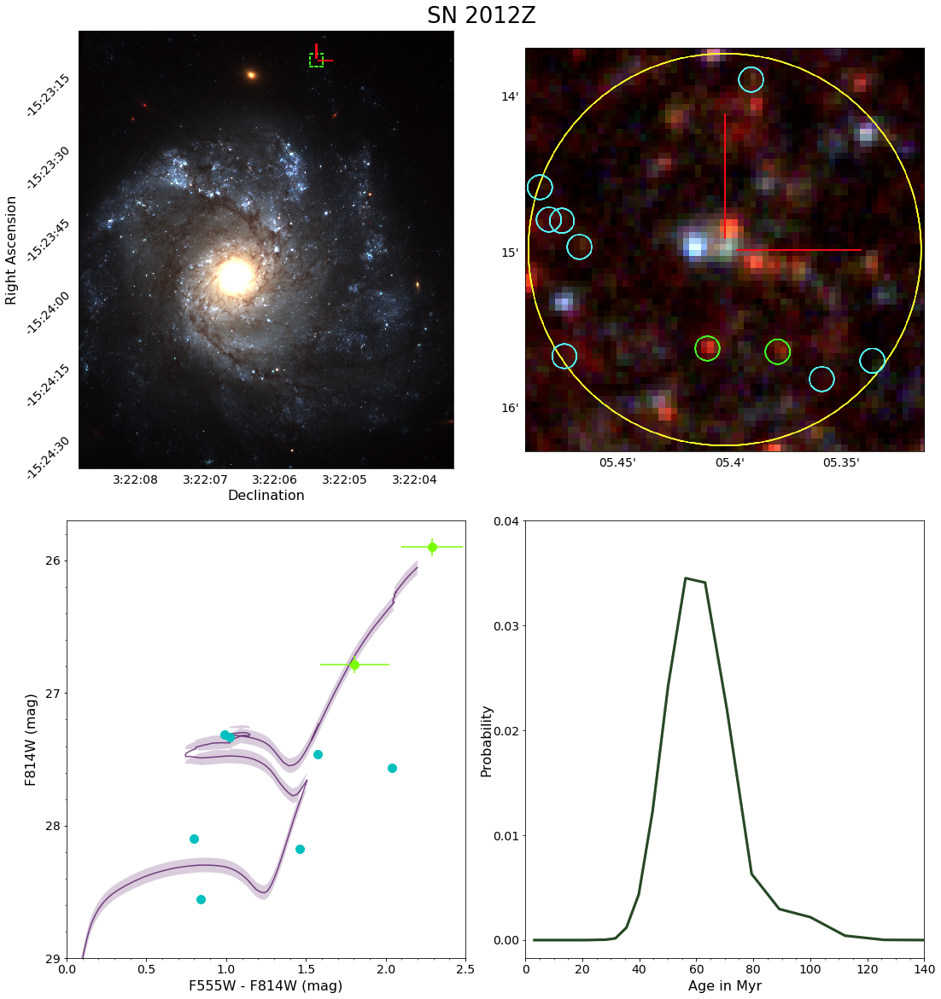

In [113]:
from matplotlib import gridspec
import matplotlib.image as im
from matplotlib.ticker import MultipleLocator
from matplotlib.patches import Rectangle

# Setup figure and grid
fig = plt.figure(figsize=(18,20))
gs = gridspec.GridSpec(2, 2)
gs.update(wspace=0.15, hspace=0.12)

axis_font = {'size':'16'} # Sets font size
tick_font = {'size':'14'}

ax0 = plt.subplot(gs[0,0])
image=im.imread(Iax_dir + '/Iax_Pictures/2012z_12kpc.14kpc.png')
ax0.imshow(image)
x_tick = 848/(8.809 - 3.448)
x_start = x_tick*.809
ax0.set_xticks([x_start, x_start+x_tick, x_start+2*x_tick, x_start+3*x_tick, x_start+4*x_tick])
ax0.set_xticklabels(['3:22:08', '3:22:07', '3:22:06', '3:22:05', '3:22:04'], **tick_font)
y_tick = 992/(99.32 - 8.87)
y_start = y_tick*9.32
ax0.set_yticks([y_start, y_start + 15*y_tick, y_start + 30*y_tick,
                y_start + 45*y_tick, y_start + 60*y_tick, y_start + 75*y_tick])
ax0.set_yticklabels(['-15:23:15', '-15:23:30', '-15:23:45', '-15:24:00', '-15:24:15', '-15:24:30'],
                    rotation=45, **tick_font)
ax0.set_xlabel("Declination", **axis_font)
ax0.set_ylabel("Right Ascension", **axis_font)
ax0.xaxis.set_label_coords(.5, -.05)
ax0.xaxis.set_ticks_position('none')
ax0.yaxis.set_label_coords(-.16, .5)
ax0.yaxis.set_ticks_position('none')

ax1 = plt.subplot(gs[0,1])
image=im.imread(Iax_dir + '/Iax_Pictures/2012z_400pc.400pc.png')
ax1.imshow(image)
x_tick = 978/(5.491 - 5.313)
x_start = x_tick*.041
ax1.set_xticks([x_start, x_start + .05*x_tick, x_start + .1*x_tick])
ax1.set_xticklabels(["05.45'", "05.4'", "05.35'"], **tick_font)
y_tick = 989/(16.31 - 13.72)
y_start = y_tick*.31
ax1.set_yticks([y_start, y_start + y_tick, y_start + 2*y_tick])
ax1.set_yticklabels(["14'", "15'", "16'"], **tick_font)
ax1.xaxis.set_label_coords(.5, -.18)
ax1.xaxis.set_ticks_position('none')
ax1.yaxis.set_label_coords(-.45, .5)
ax1.yaxis.set_ticks_position('none')

ax2 = plt.subplot(gs[1,0])
for age, (color, mag, mag_lower, mag_upper) in age_cmd.items():
    ax2.plot(color, mag, alpha=0.7, color=sm.to_rgba(age), zorder=0)
    ax2.fill_between(color, mag_lower, mag_upper, facecolor=sm.to_rgba(age), alpha=0.2, edgecolor='none')
# Plots stars
line1 = ax2.plot(new_info1[:,28] - new_info1[:,41], new_info1[:,41], 'co', markersize=10)
line2 = ax2.errorbar(new_info2[:,28] - new_info2[:,41], new_info2[:,41], color='lawngreen', marker='o', linestyle='',
                     xerr=np.sqrt(new_info2[:,43]**2 + new_info2[:,30]**2), yerr=new_info2[:,43], markersize=10)

ax2.set_xlabel("F555W - F814W (mag)", **axis_font)
ax2.set_ylabel("F814W (mag)", **axis_font)
ax2.xaxis.set_label_coords(.5, -.05)
ax2.yaxis.set_label_coords(-.07, .5)
ax2.set_ylim(29, 25.7) #(29,26)
ax2.set_xlim(0, 2.5) #(0, 2.5)
ax2.tick_params(axis='both', which='major', labelsize=14)
ax2.set_yticks(np.arange(26, 30))
ax2.xaxis.set_major_locator(MultipleLocator(.5))
ax2.xaxis.set_minor_locator(MultipleLocator(.1))
ax2.yaxis.set_major_locator(MultipleLocator(1))
ax2.yaxis.set_minor_locator(MultipleLocator(.2))

ax3 = plt.subplot(gs[1,1])
norm_linear = np.trapz(probs_tot, 10**(CChi[0,2,:,3,0])/1e6)
ax3.plot(10**(CChi[0,2,:,3,0])/1e6, probs_tot/norm_linear, 'g-', alpha=.6, linewidth=3)
ax3.plot(10**(CChi[0,2,:,3,0])/1e6, probs_tot/norm_linear, 'k-', alpha=.6, linewidth=3)
ax3.set_xlabel("Age in Myr", **axis_font)
ax3.set_ylabel("Probability", **axis_font)
ax3.xaxis.set_label_coords(.5, -.05)
ax3.yaxis.set_label_coords(-.08, .5)
ax3.set_xlim(0,140)
ax3.tick_params(axis='both', which='major', labelsize=14)
ax3.xaxis.set_major_locator(MultipleLocator(20))
ax3.xaxis.set_minor_locator(MultipleLocator(5))
ax3.set_yticks(np.arange(0, .05, .01));

plt.suptitle('SN 2012Z', y=.9, size=26)

plt.savefig('2012z_Fig.pdf', dpi=1000)